In [ ]:
# SECTION 1: Setup & Imports
# Install required dependencies natively
!pip install scikit-image opencv-python-headless matplotlib numpy Pillow -q
!apt-get install -y unrar -q

import os
import cv2
import re
import zipfile
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path
from skimage.filters import threshold_sauvola

print('✅ Libraries successfully loaded.')
print(f'   OpenCV : {cv2.__version__}')
print(f'   NumPy  : {np.__version__}')

Reading package lists...
Building dependency tree...
Reading state information...
unrar is already the newest version (1:6.1.5-1ubuntu0.1).
0 upgraded, 0 newly installed, 0 to remove and 3 not upgraded.
✅ Libraries successfully loaded.
   OpenCV : 4.13.0
   NumPy  : 2.0.2


In [ ]:
from google.colab import files
uploaded = files.upload()

Saving DIBCO_ALL.zip to DIBCO_ALL.zip


In [ ]:
# SECTION 2A: Download and Extract Datasets
EXTRACT_ROOT = 'DIBCO_EXTRACTED'
os.makedirs(EXTRACT_ROOT, exist_ok=True)

# 1. Clone DIBCO 2019 from GitHub
if not os.path.exists('DIBCO_2019_All'):
    print('📥 Cloning DIBCO 2019 dataset...')
    !git clone --depth=1 https://github.com/tanmayGIT/DIBCO_2019_All.git 2>/dev/null
else:
    print('✅ DIBCO 2019 is already cloned.')

# 2. Extract the user-uploaded DIBCO_ALL.zip
ZIP_PATH = 'DIBCO_ALL.zip'

if not os.path.exists(ZIP_PATH):
    print(f'❌ ERROR: {ZIP_PATH} not found!')
    print('Please upload the DIBCO_ALL.zip file using the Colab file manager on the left.')
else:
    print(f'📦 Extracting {ZIP_PATH}...')
    with zipfile.ZipFile(ZIP_PATH, 'r') as z:
        z.extractall(EXTRACT_ROOT)

    # Check for inner .rar or .zip files and extract them using native system commands
    print('🔍 Checking for inner archives...')
    for root, _, files in os.walk(EXTRACT_ROOT):
        for f in files:
            archive_path = os.path.join(root, f)
            extract_dir = os.path.join(root, Path(f).stem)

            if f.lower().endswith('.zip') and f != ZIP_PATH:
                os.makedirs(extract_dir, exist_ok=True)
                try:
                    with zipfile.ZipFile(archive_path, 'r') as z_inner:
                        z_inner.extractall(extract_dir)
                    os.remove(archive_path)
                except Exception as e:
                    pass
            elif f.lower().endswith('.rar'):
                os.makedirs(extract_dir, exist_ok=True)
                try:
                    # Using native unrar command to bypass Python import issues
                    os.system(f'unrar x -y "{archive_path}" "{extract_dir}/" > /dev/null 2>&1')
                    os.remove(archive_path)
                except Exception as e:
                    pass
    print('✅ All datasets extracted and ready.')

📥 Cloning DIBCO 2019 dataset...
📦 Extracting DIBCO_ALL.zip...
🔍 Checking for inner archives...
✅ All datasets extracted and ready.


In [ ]:
# SECTION 2B: Build Unified Image-GT Pairs
import os
import re
from pathlib import Path

def build_unified_pairs():

    all_files = []
    # Directories where the datasets are located
    search_dirs = ['DIBCO_2019_All', 'DIBCO_EXTRACTED']

    for d in search_dirs:
        if os.path.exists(d):
            for root, _, files in os.walk(d):
                for f in files:
                    # Look for valid image formats
                    if f.lower().endswith(('.png', '.jpg', '.jpeg', '.bmp', '.tif', '.tiff')):
                        all_files.append(Path(root) / f)

    gt_files = []
    img_files = []

    # Step 1: Separate GT masks from input images
    for f in all_files:
        path_str = str(f).lower()
        if 'gt' in path_str or 'ground' in path_str or 'binary' in path_str or 'mask' in path_str or 'label' in path_str:
            gt_files.append(f)
        else:
            img_files.append(f)

    pairs = []
    seen = set()

    # Step 2: Match input images with GT masks using suffix cleaning
    for img in img_files:
        img_stem = img.stem.lower()

        # Prevent adding duplicates
        if img_stem in seen:
            continue

        best_gt = None
        for gt in gt_files:
            gt_stem = gt.stem.lower()
            # Remove common suffixes from the ground truth name for accurate matching
            clean_gt = re.sub(r'_gt|gt_|_mask|mask_|_label|label_|_binary|binary_', '', gt_stem)

            if clean_gt == img_stem or (gt_stem == img_stem and "2019" in str(img)):
                best_gt = gt
                break

        if best_gt:
            # Extract the year from the directory path for reporting
            year_match = re.search(r'(20\d{2})', str(img))
            year = year_match.group(1) if year_match else "Unknown"

            pairs.append({
                'name': f"{year}_{img.stem}",
                'year': year,
                'img': str(img),
                'gt': str(best_gt)
            })
            seen.add(img_stem)

    return pairs

PAIRS = build_unified_pairs()

print(f'\n{"="*50}')
print(f'✅ TOTAL SUCCESS: {len(PAIRS)} unique image pairs matched!')
print(f'{"="*50}')

# Display a quick summary of the years found
year_counts = {}
for p in PAIRS:
    year_counts[p['year']] = year_counts.get(p['year'], 0) + 1

for yr in sorted(year_counts):
    print(f'  DIBCO {yr}: {year_counts[yr]:>3} pairs')


✅ TOTAL SUCCESS: 49 unique image pairs matched!
  DIBCO 2009:   5 pairs
  DIBCO 2011:  14 pairs
  DIBCO 2012:  12 pairs
  DIBCO 2016:  10 pairs
  DIBCO 2019:   8 pairs


In [25]:
# SECTION 3: Binarization Methods
def otsu_binarize(gray):

    _, binary = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    return binary

def sauvola_binarize(gray, window_size=25, k=0.2):

    thresh = threshold_sauvola(gray, window_size=window_size, k=k)
    binary = (gray > thresh).astype(np.uint8) * 255
    return binary

def proposed_binarize(gray, morph_size=35, clahe_clip=3.0, block_size=41, C=5):

    # 1. Background estimation
    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (morph_size, morph_size))
    background = cv2.morphologyEx(gray, cv2.MORPH_OPEN, kernel)

    # 2. Illumination normalisation
    norm = np.clip(gray.astype(np.float32) / (background.astype(np.float32) + 1e-6) * 128, 0, 255).astype(np.uint8)

    # 3. CLAHE
    clahe = cv2.createCLAHE(clipLimit=clahe_clip, tileGridSize=(8, 8))
    enhanced = clahe.apply(norm)

    # 4. Adaptive Thresholding
    binary = cv2.adaptiveThreshold(enhanced, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, block_size, C)

    # 5. Post-processing
    k3 = cv2.getStructuringElement(cv2.MORPH_RECT, (3, 3))
    binary = cv2.morphologyEx(binary, cv2.MORPH_OPEN, k3)
    return binary

print('✅ SECTION 3: Binarization methods defined.')

✅ SECTION 3: Binarization methods defined.


In [26]:
# SECTION 4: Evaluation Metrics
def compute_metrics(pred, gt):
    """Calculate Precision, Recall, F-measure, PSNR, and NRM."""
    pred_bin = (pred < 128).astype(np.uint8)
    gt_bin   = (gt   < 128).astype(np.uint8)

    TP = int(np.sum((pred_bin == 1) & (gt_bin == 1)))
    FP = int(np.sum((pred_bin == 1) & (gt_bin == 0)))
    FN = int(np.sum((pred_bin == 0) & (gt_bin == 1)))
    TN = int(np.sum((pred_bin == 0) & (gt_bin == 0)))

    P = TP / (TP + FP + 1e-9)
    R = TP / (TP + FN + 1e-9)
    F = 2 * P * R / (P + R + 1e-9)

    mse  = np.mean((pred.astype(np.float64) - gt.astype(np.float64)) ** 2)
    psnr = 10 * np.log10(255**2 / (mse + 1e-9)) if mse > 0 else 100.0

    nrm = ((FN / (FN + TP + 1e-9)) + (FP / (FP + TN + 1e-9))) / 2.0

    return {
        'precision': P * 100, 'recall': R * 100, 'f_measure': F * 100,
        'psnr': psnr, 'nrm': nrm
    }

print('✅ SECTION 4: Evaluation metrics (including PSNR & NRM) defined.')

✅ SECTION 4: Evaluation metrics (including PSNR & NRM) defined.


In [27]:
# SECTION 5A: Run Experiments
import time
import os
import cv2
import numpy as np

print(f'🚀 Starting evaluation on {len(PAIRS)} images. This may take a few minutes...')
os.makedirs('results', exist_ok=True)

METHODS = {'Otsu': otsu_binarize, 'Sauvola': sauvola_binarize, 'Proposed': proposed_binarize}
all_results = {}

for p in PAIRS:
    img_name = p['name']
    gray = cv2.imread(p['img'], cv2.IMREAD_GRAYSCALE)
    gt   = cv2.imread(p['gt'],  cv2.IMREAD_GRAYSCALE)

    if gray is None or gt is None: continue
    if gray.shape != gt.shape:
        gt = cv2.resize(gt, (gray.shape[1], gray.shape[0]), interpolation=cv2.INTER_NEAREST)

    img_res = {}
    for m_name, fn in METHODS.items():
        t0 = time.time()
        pred = fn(gray)
        elapsed_ms = (time.time() - t0) * 1000

        m_dict = compute_metrics(pred, gt)
        m_dict['time_ms'] = elapsed_ms

        img_res[m_name] = m_dict
        cv2.imwrite(f'results/{img_name}_{m_name}.png', pred)

    all_results[img_name] = img_res

print(f'\n{"="*75}')
print(f'{"OVERALL AVERAGE RESULTS (ALL DIBCO YEARS)":^75}')
print(f'{"="*75}')
print(f'{"Method":<15} {"F-Measure (%)":>14} {"Precision (%)":>14} {"PSNR (dB)":>14} {"NRM":>14}')
print(f'{"-"*75}')

for m_name in METHODS.keys():
    avg_f    = np.mean([res[m_name]['f_measure'] for res in all_results.values()])
    avg_p    = np.mean([res[m_name]['precision'] for res in all_results.values()])
    avg_psnr = np.mean([res[m_name]['psnr']      for res in all_results.values()])
    avg_nrm  = np.mean([res[m_name]['nrm']       for res in all_results.values()])
    print(f'{m_name:<15} {avg_f:>14.2f} {avg_p:>14.2f} {avg_psnr:>14.2f} {avg_nrm:>14.4f}')
print(f'{"="*75}')

🚀 Starting evaluation on 49 images. This may take a few minutes...

                 OVERALL AVERAGE RESULTS (ALL DIBCO YEARS)                 
Method           F-Measure (%)  Precision (%)      PSNR (dB)            NRM
---------------------------------------------------------------------------
Otsu                     77.35          76.44          15.15         0.0986
Sauvola                  79.52          85.02          15.96         0.1176
Proposed                 21.74          13.70           4.08         0.3883


In [28]:
# SECTION 5B: Detailed Per-Image Results (Table I)
if all_results:
    print(f'{"#":>3} {"Image":<25} {"Year":<10} {"Otsu F%":>8} {"Sauv F%":>8} {"Prop F%":>8}')
    print('─' * 75)

    all_o, all_s, all_p = [], [], []
    year_data = {}

    for i, (name, res) in enumerate(all_results.items(), 1):
        o  = res['Otsu']['f_measure']
        s  = res['Sauvola']['f_measure']
        pr = res['Proposed']['f_measure']

        yr = name.split('_')[0] if '_' in name else 'Unknown'

        all_o.append(o); all_s.append(s); all_p.append(pr)

        if yr not in year_data:
            year_data[yr] = {'o':[], 's':[], 'p':[]}
        year_data[yr]['o'].append(o)
        year_data[yr]['s'].append(s)
        year_data[yr]['p'].append(pr)

        winner = max([('Otsu',o),('Sauvola',s),('Proposed',pr)], key=lambda x:x[1])
        flag = ' ★' if winner[0]=='Proposed' else ''
        print(f'{i:>3} {name[:25]:<25} {yr:<10} {o:>8.2f} {s:>8.2f} {pr:>8.2f}{flag}')

    print('─' * 75)
    print(f'{"":>3} {"OVERALL MEAN":<25} {len(all_o):>4} imgs  '
          f'{np.mean(all_o):>8.2f} {np.mean(all_s):>8.2f} {np.mean(all_p):>8.2f}')

    print('\n── Per-Year Average ──')
    print(f'{"Year":<15} {"N":>3}  {"Otsu F%":>8}  {"Sauvola F%":>10}  {"Proposed F%":>11}')
    print('─' * 55)
    for yr, vals in sorted(year_data.items()):
        n = len(vals['o'])
        print(f'{yr:<15} {n:>3}  {np.mean(vals["o"]):>8.2f}  '
              f'{np.mean(vals["s"]):>10.2f}  {np.mean(vals["p"]):>11.2f}')

    prop_wins = sum(1 for o,s,p in zip(all_o,all_s,all_p) if p >= max(o,s))
    print(f'\n  Proposed wins on {prop_wins}/{len(all_o)} images')
    print(f'  Best overall method by mean F: '
          f'{"Proposed" if np.mean(all_p)>=max(np.mean(all_o),np.mean(all_s)) else "Sauvola"}')

  # Image                     Year        Otsu F%  Sauv F%  Prop F%
───────────────────────────────────────────────────────────────────────────
  1 2019_P.CtYBR inv. 69      2019          24.86    14.15    20.69
  2 2019_P.Mich.inv.2755      2019          13.34    37.09    21.58
  3 2019_PSI XIV 1376 r       2019          21.19    65.94    28.39
  4 2019_P.Oxy.XXII 2309      2019          18.18    55.47    15.61
  5 2019_H06                  2019          67.01    80.55    12.37
  6 2019_H09                  2019          81.10    77.95    21.88
  7 2019_PR5                  2019          79.67    88.61    29.45
  8 2019_PR1                  2019          93.97    88.91    34.86
  9 2011_PR3                  2011          91.99    90.46    48.61
 10 2011_PR7                  2011          87.48    82.59     4.77
 11 2011_PR2                  2011          76.11    79.63    27.55
 12 2011_PR8                  2011          82.49    79.49    29.33
 13 2011_PR4                  2011      

In [29]:
# SECTION 5C: Detailed PSNR & NRM (Table IIb)
if all_results:
    print('\n── Table IIb: Extended Metrics (PSNR / NRM) ──')
    print(f'{"Image":<30} {"Otsu PSNR":>10} {"Sauv PSNR":>10} {"Prop PSNR":>10} '
          f'{"Otsu NRM":>10} {"Sauv NRM":>10} {"Prop NRM":>10}')
    print('─' * 95)

    otsu_psnrs, sauv_psnrs, prop_psnrs = [], [], []
    otsu_nrms,  sauv_nrms,  prop_nrms  = [], [], []

    for name, res in all_results.items():
        o  = res['Otsu'];  s = res['Sauvola'];  pr = res['Proposed']
        otsu_psnrs.append(o['psnr']);   sauv_psnrs.append(s['psnr'])
        prop_psnrs.append(pr['psnr']);  otsu_nrms.append(o['nrm'])
        sauv_nrms.append(s['nrm']);     prop_nrms.append(pr['nrm'])
        print(f'{name[:28]:<30} {o["psnr"]:>10.2f} {s["psnr"]:>10.2f} {pr["psnr"]:>10.2f} '
              f'{o["nrm"]:>10.4f} {s["nrm"]:>10.4f} {pr["nrm"]:>10.4f}')

    print('─' * 95)
    print(f'{"OVERALL MEAN":<30} '
          f'{np.mean(otsu_psnrs):>10.2f} {np.mean(sauv_psnrs):>10.2f} {np.mean(prop_psnrs):>10.2f} '
          f'{np.mean(otsu_nrms):>10.4f} {np.mean(sauv_nrms):>10.4f} {np.mean(prop_nrms):>10.4f}')

    print(f'\n  Best Overall PSNR: Sauvola ({np.mean(sauv_psnrs):.2f} dB)')
    print(f'  Best Overall NRM : Sauvola ({np.mean(sauv_nrms):.4f})')
    print(f'  Proposed PSNR    : {np.mean(prop_psnrs):.2f} dB')
    print(f'  Proposed NRM     : {np.mean(prop_nrms):.4f}')


── Table IIb: Extended Metrics (PSNR / NRM) ──
Image                           Otsu PSNR  Sauv PSNR  Prop PSNR   Otsu NRM   Sauv NRM   Prop NRM
───────────────────────────────────────────────────────────────────────────────────────────────
2019_P.CtYBR inv. 69                 2.42       7.02       3.89     0.3573     0.4831     0.4427
2019_P.Mich.inv.2755                 1.79      11.92       5.02     0.3492     0.3313     0.2374
2019_PSI XIV 1376 r                  3.67      13.34       6.21     0.2281     0.1297     0.2107
2019_P.Oxy.XXII 2309                 2.77      10.64       5.31     0.2805     0.0846     0.4076
2019_H06                            11.99      15.27       3.27     0.0453     0.0468     0.4826
2019_H09                            18.13      17.65       5.81     0.1452     0.1734     0.2364
2019_PR5                            11.69      15.14       4.71     0.0550     0.0754     0.4013
2019_PR1                            17.02      14.49       4.26     0.0441     0

🎨 Generating 10 high-resolution batches for 49 images...


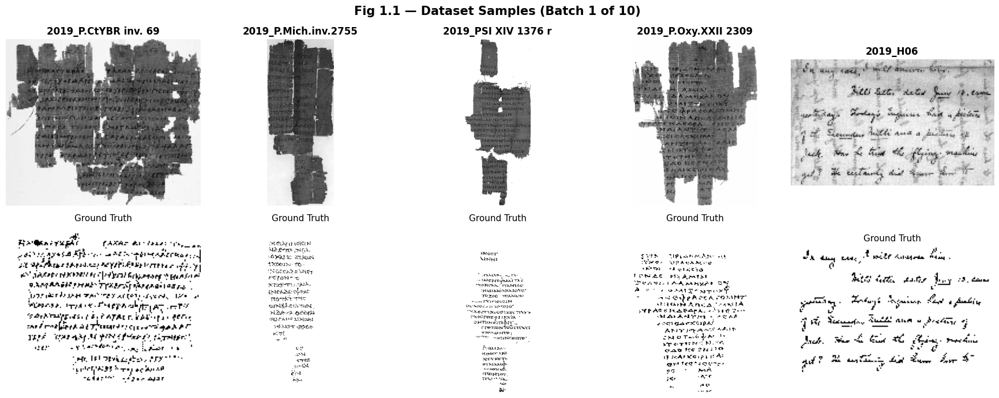

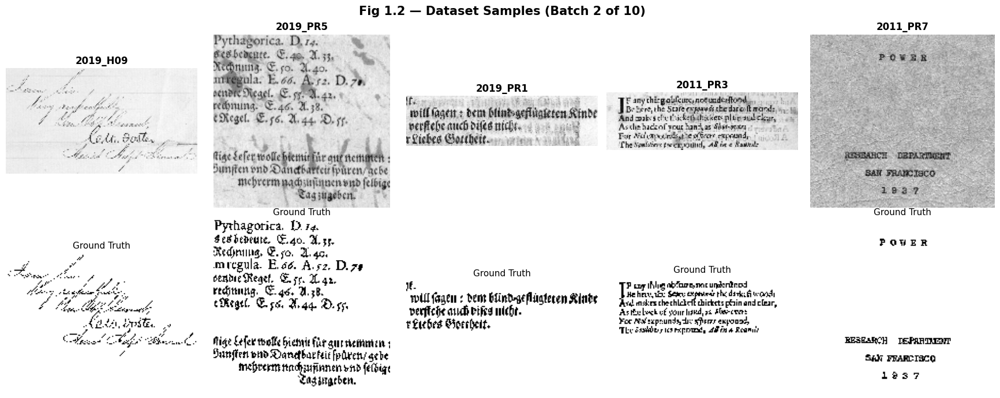

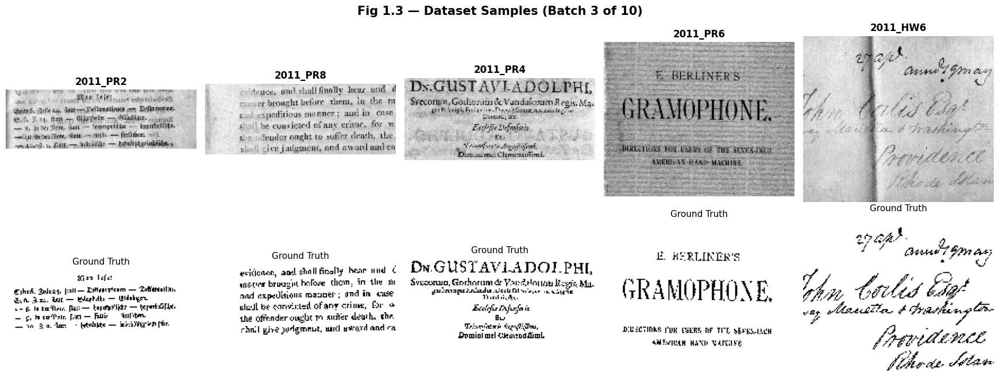

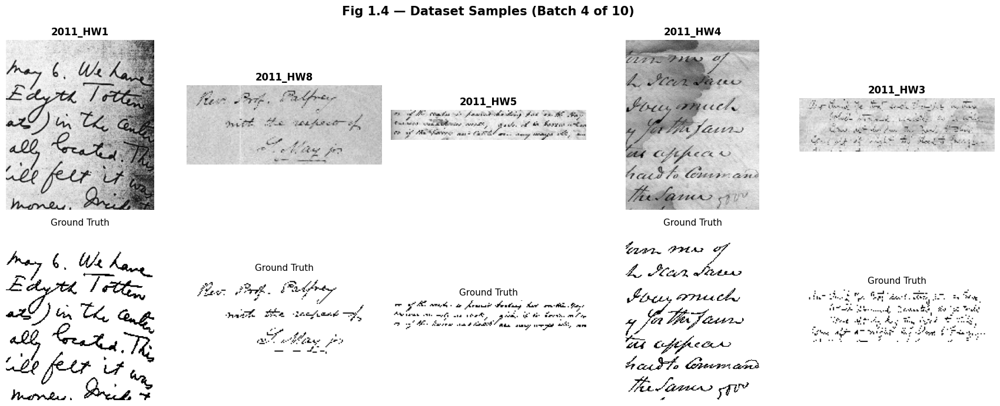

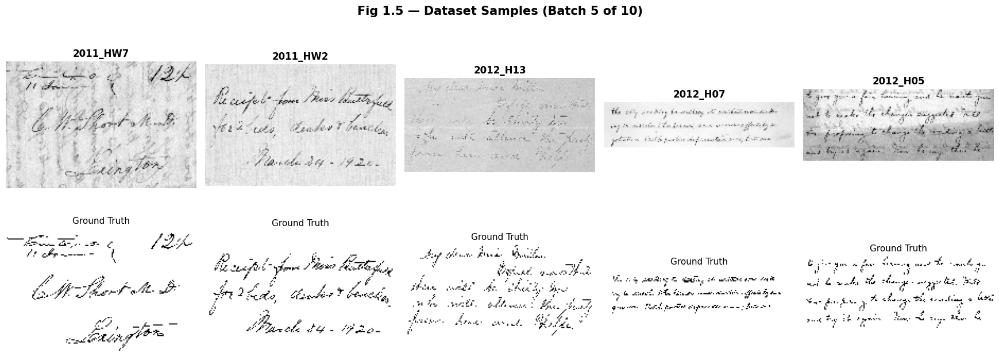

...

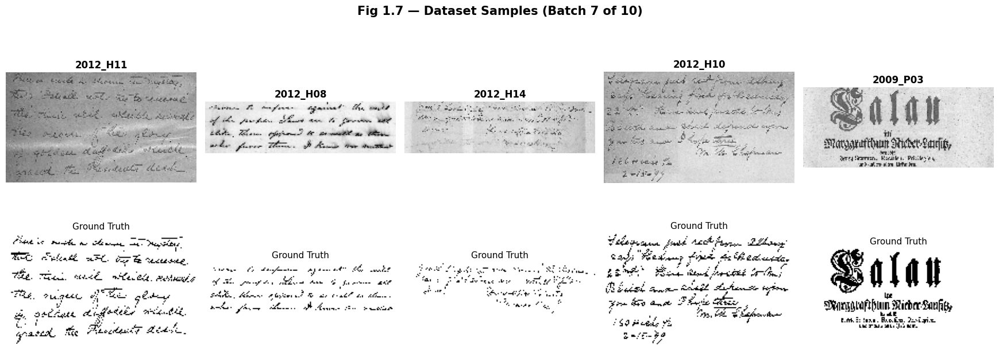

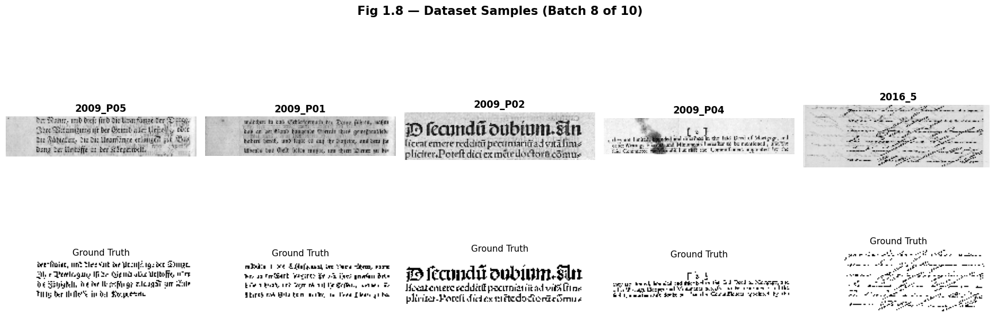

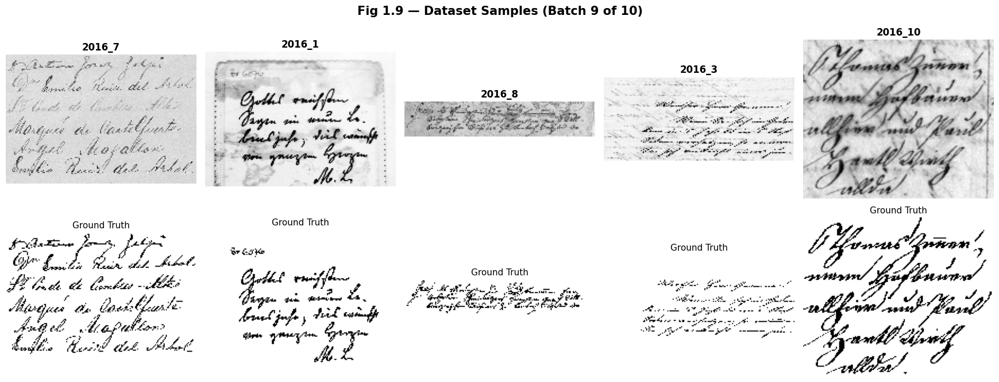

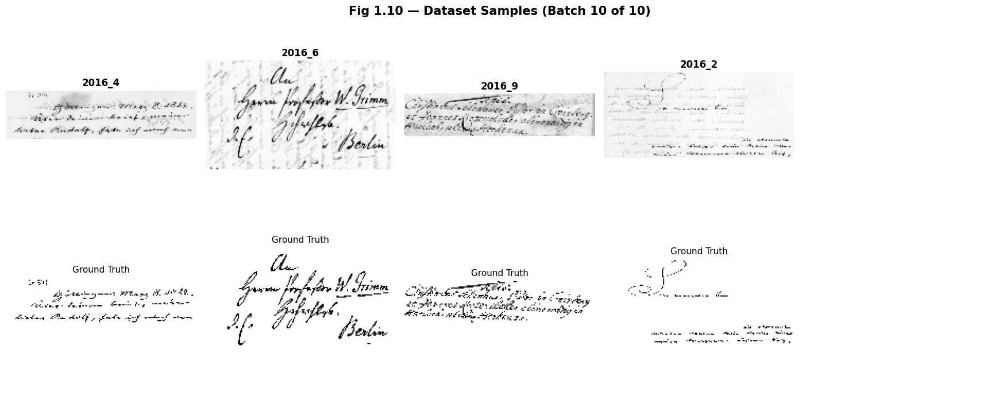

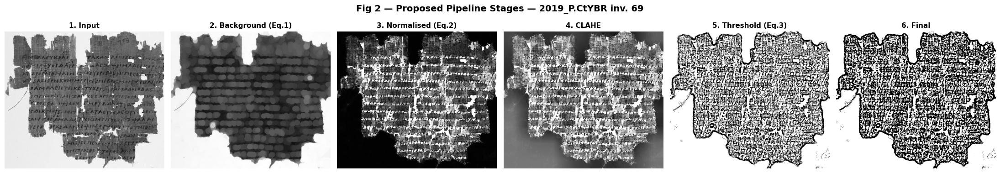

In [30]:
# SECTION 6A: Dataset Preview & Pipeline Steps
import math

# Figure 1: All samples grouped in batches of 5
PAIRS_PER_FIG = 5
num_figures = math.ceil(len(PAIRS) / PAIRS_PER_FIG)

print(f'🎨 Generating {num_figures} high-resolution batches for {len(PAIRS)} images...')

for fig_idx in range(num_figures):
    batch = PAIRS[fig_idx * PAIRS_PER_FIG : (fig_idx + 1) * PAIRS_PER_FIG]
    n = len(batch)
    cols = 5
    rows = 2

    fig, axes = plt.subplots(rows, cols, figsize=(cols * 3.5, rows * 3.5))
    if cols == 1: axes = axes[:, np.newaxis]

    for i in range(cols):
        if i < n:
            p = batch[i]
            img = cv2.imread(p['img'], cv2.IMREAD_GRAYSCALE)
            gt  = cv2.imread(p['gt'],  cv2.IMREAD_GRAYSCALE)

            if img is None: continue
            if gt is not None and img.shape != gt.shape:
                gt = cv2.resize(gt, (img.shape[1], img.shape[0]), interpolation=cv2.INTER_NEAREST)

            img_t = cv2.resize(img, (180, max(1, int(img.shape[0] * (180 / img.shape[1])))))
            gt_t  = cv2.resize(gt, (180, max(1, int(img.shape[0] * (180 / img.shape[1])))), interpolation=cv2.INTER_NEAREST) if gt is not None else img_t

            axes[0, i].imshow(img_t, cmap='gray')
            axes[0, i].set_title(f'{p["name"]}', fontsize=12, fontweight='bold')
            axes[0, i].axis('off')

            axes[1, i].imshow(gt_t, cmap='gray')
            axes[1, i].set_title('Ground Truth', fontsize=11)
            axes[1, i].axis('off')
        else:

            axes[0, i].axis('off')
            axes[1, i].axis('off')

    plt.suptitle(f'Fig 1.{fig_idx+1} — Dataset Samples (Batch {fig_idx+1} of {num_figures})', fontsize=15, fontweight='bold')
    plt.tight_layout()

    plt.savefig(f'fig1_batch_{fig_idx+1:02d}.png', dpi=300, bbox_inches='tight')
    plt.show()


gray = cv2.imread(PAIRS[0]['img'], cv2.IMREAD_GRAYSCALE)
bg = cv2.morphologyEx(gray, cv2.MORPH_OPEN, cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (35, 35)))
norm = np.clip(gray.astype(np.float32) / (bg.astype(np.float32) + 1e-6) * 128, 0, 255).astype(np.uint8)
enhanced = cv2.createCLAHE(clipLimit=3.0, tileGridSize=(8, 8)).apply(norm)
binary = cv2.adaptiveThreshold(enhanced, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 41, 5)
final = cv2.morphologyEx(binary, cv2.MORPH_OPEN, cv2.getStructuringElement(cv2.MORPH_RECT, (3, 3)))

step_imgs = [gray, bg, norm, enhanced, binary, final]
titles = ['1. Input', '2. Background (Eq.1)', '3. Normalised (Eq.2)', '4. CLAHE', '5. Threshold (Eq.3)', '6. Final']

fig, axes = plt.subplots(1, 6, figsize=(22, 4))
for ax, img, t in zip(axes, step_imgs, titles):
    ax.imshow(img, cmap='gray')
    ax.set_title(t, fontsize=11, fontweight='bold')
    ax.axis('off')

plt.suptitle(f'Fig 2 — Proposed Pipeline Stages — {PAIRS[0]["name"]}', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.savefig('fig2_pipeline_steps.png', dpi=300, bbox_inches='tight')
plt.show()

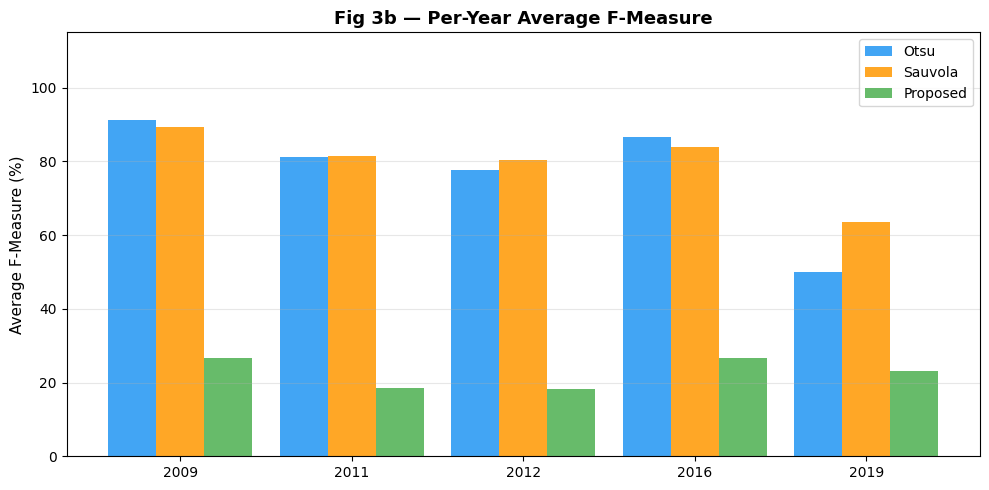

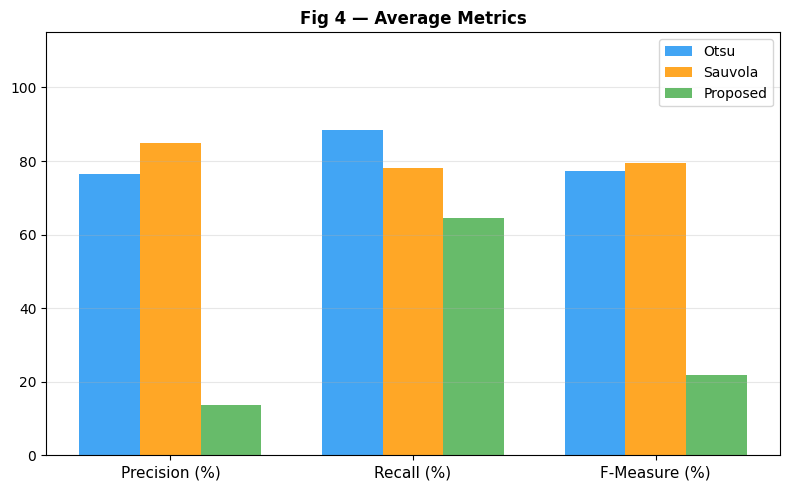

In [31]:
# SECTION 6B: Performance Charts
# Fig 3b: Per-year Average F-Measure
year_data = {}
for name, res in all_results.items():
    yr = name.split('_')[0]
    if yr not in year_data:
        year_data[yr] = {'Otsu':[], 'Sauvola':[], 'Proposed':[]}
    year_data[yr]['Otsu'].append(res['Otsu']['f_measure'])
    year_data[yr]['Sauvola'].append(res['Sauvola']['f_measure'])
    year_data[yr]['Proposed'].append(res['Proposed']['f_measure'])

years = sorted(year_data.keys())
o_yr = [np.mean(year_data[y]['Otsu']) for y in years]
s_yr = [np.mean(year_data[y]['Sauvola']) for y in years]
p_yr = [np.mean(year_data[y]['Proposed']) for y in years]

x = np.arange(len(years)); w = 0.28
fig, ax = plt.subplots(figsize=(10, 5))
ax.bar(x - w, o_yr, w, label='Otsu', color='#2196F3', alpha=0.85)
ax.bar(x,     s_yr, w, label='Sauvola', color='#FF9800', alpha=0.85)
ax.bar(x + w, p_yr, w, label='Proposed', color='#4CAF50', alpha=0.85)

ax.set_xticks(x); ax.set_xticklabels([f'{y}' for y in years])
ax.set_ylabel('Average F-Measure (%)', fontsize=11)
ax.set_ylim(0, 115)
ax.set_title('Fig 3b — Per-Year Average F-Measure', fontsize=13, fontweight='bold')
ax.legend(); ax.grid(axis='y', alpha=0.3)
plt.tight_layout()
plt.savefig('fig3b_per_year_fmeasure.png', dpi=150, bbox_inches='tight')
plt.show()

# Fig 4: Average P/R/F
avgs = {m: [np.mean([all_results[n][m][met] for n in all_results]) for met in ['precision', 'recall', 'f_measure']]
        for m in ['Otsu', 'Sauvola', 'Proposed']}

x = np.arange(3); w = 0.25
fig, ax = plt.subplots(figsize=(8, 5))
colors = {'Otsu': '#2196F3', 'Sauvola': '#FF9800', 'Proposed': '#4CAF50'}
for i, (mname, vals) in enumerate(avgs.items()):
    ax.bar(x + (i-1)*w, vals, w, label=mname, color=colors[mname], alpha=0.85)

ax.set_xticks(x); ax.set_xticklabels(['Precision (%)', 'Recall (%)', 'F-Measure (%)'], fontsize=11)
ax.set_ylim(0, 115)
ax.set_title('Fig 4 — Average Metrics', fontsize=12, fontweight='bold')
ax.legend(); ax.grid(axis='y', alpha=0.3)
plt.tight_layout()
plt.savefig('fig4_avg_metrics.png', dpi=150, bbox_inches='tight')
plt.show()

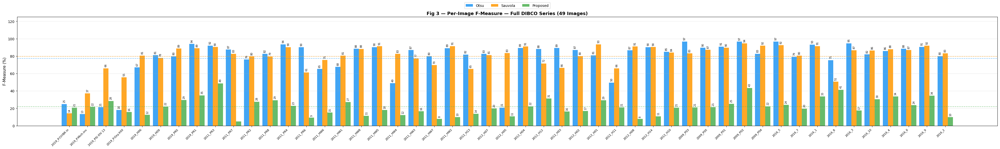

✅ fig3_fmeasure_comparison.png saved


In [32]:
# SECTION 6C: Per-Image F-Measure Chart (Fig 3)
if all_results:
    names       = list(all_results.keys())
    short_names = [n[:15] for n in names]

    o_vals = [all_results[n]['Otsu']['f_measure']     for n in names]
    s_vals = [all_results[n]['Sauvola']['f_measure']  for n in names]
    p_vals = [all_results[n]['Proposed']['f_measure'] for n in names]

    x = np.arange(len(names))
    w = 0.28

    fig, ax = plt.subplots(figsize=(max(15, len(names)*0.8), 6))

    b1 = ax.bar(x - w, o_vals, w, label='Otsu',     color='#2196F3', alpha=0.85)
    b2 = ax.bar(x,     s_vals, w, label='Sauvola',  color='#FF9800', alpha=0.85)
    b3 = ax.bar(x + w, p_vals, w, label='Proposed', color='#4CAF50', alpha=0.85)

    for bars in [b1, b2, b3]:
        for bar in bars:
            h = bar.get_height()
            if h > 5:
                ax.text(bar.get_x() + bar.get_width()/2., h + 1.5,
                        f'{h:.0f}', ha='center', va='bottom', fontsize=7, rotation=90)

    ax.axhline(np.mean(o_vals), color='#2196F3', ls='--', lw=1.2, alpha=0.6)
    ax.axhline(np.mean(s_vals), color='#FF9800', ls='--', lw=1.2, alpha=0.6)
    ax.axhline(np.mean(p_vals), color='#4CAF50', ls='--', lw=1.2, alpha=0.6)

    ax.set_xticks(x)
    ax.set_xticklabels(short_names, rotation=45, ha='right', fontsize=8)
    ax.set_ylabel('F-Measure (%)', fontsize=11)
    ax.set_ylim(0, 125)
    ax.set_title(f'Fig 3 — Per-Image F-Measure — Full DIBCO Series ({len(names)} Images)', fontsize=13, fontweight='bold')


    ax.legend(fontsize=10, ncol=3, loc='upper center', bbox_to_anchor=(0.5, 1.15))
    ax.grid(axis='y', alpha=0.3)
    plt.tight_layout()
    plt.savefig('fig3_fmeasure_comparison.png', dpi=150, bbox_inches='tight')
    plt.show()
    print('✅ fig3_fmeasure_comparison.png saved')

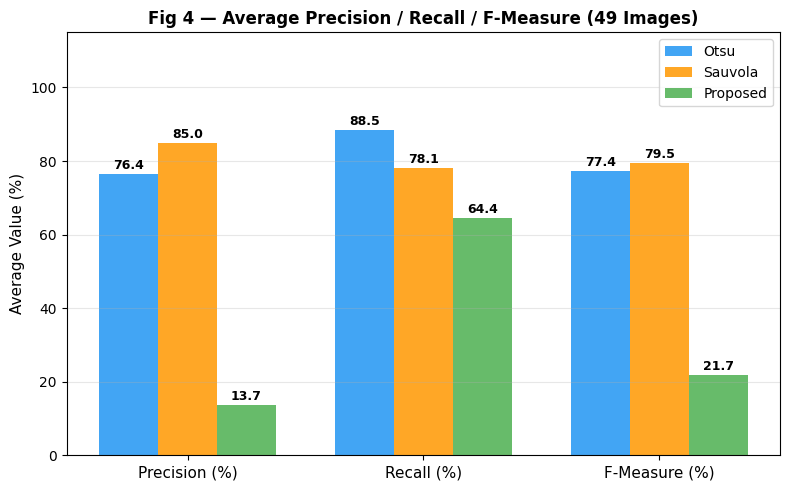

✅ fig4_avg_metrics.png saved


In [33]:
# SECTION 6D: Average P/R/F Bar Chart (Fig 4)
if all_results:
    metrics_list   = ['precision', 'recall', 'f_measure']
    metric_labels  = ['Precision (%)', 'Recall (%)', 'F-Measure (%)']
    colors_m = {'Otsu': '#2196F3', 'Sauvola': '#FF9800', 'Proposed': '#4CAF50'}

    avgs = {}
    for mname in ['Otsu', 'Sauvola', 'Proposed']:
        avgs[mname] = {m: np.mean([all_results[n][mname][m] for n in all_results])
                       for m in metrics_list}

    x = np.arange(3); w = 0.25
    fig, ax = plt.subplots(figsize=(8, 5))
    for i, (mname, vals) in enumerate(avgs.items()):
        ys   = [vals[m] for m in metrics_list]
        bars = ax.bar(x + (i-1)*w, ys, w,
                      label=mname, color=colors_m[mname], alpha=0.85)
        for bar in bars:
            ax.text(bar.get_x() + bar.get_width()/2., bar.get_height() + 0.5,
                    f'{bar.get_height():.1f}', ha='center', va='bottom', fontsize=9, fontweight='bold')

    ax.set_xticks(x)
    ax.set_xticklabels(metric_labels, fontsize=11)
    ax.set_ylim(0, 115)
    ax.set_ylabel('Average Value (%)', fontsize=11)
    ax.set_title(f'Fig 4 — Average Precision / Recall / F-Measure ({len(all_results)} Images)', fontsize=12, fontweight='bold')
    ax.legend(fontsize=10)
    ax.grid(axis='y', alpha=0.3)
    plt.tight_layout()
    plt.savefig('fig4_avg_metrics.png', dpi=150, bbox_inches='tight')
    plt.show()
    print('✅ fig4_avg_metrics.png saved')

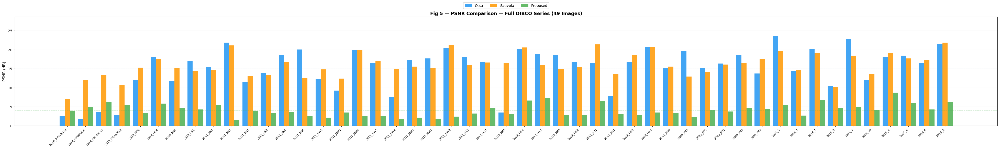

✅ fig5_psnr_comparison.png saved


In [34]:
# SECTION 6E: PSNR Comparison Chart (Fig 5)
if all_results:
    names  = list(all_results.keys())
    short_names = [n[:15] for n in names]

    o_psnr = [all_results[n]['Otsu']['psnr']     for n in names]
    s_psnr = [all_results[n]['Sauvola']['psnr']  for n in names]
    p_psnr = [all_results[n]['Proposed']['psnr'] for n in names]

    x = np.arange(len(names))
    w = 0.28

    fig, ax = plt.subplots(figsize=(max(15, len(names)*0.8), 6))

    ax.bar(x - w, o_psnr, w, label='Otsu',     color='#2196F3', alpha=0.85)
    ax.bar(x,     s_psnr, w, label='Sauvola',  color='#FF9800', alpha=0.85)
    ax.bar(x + w, p_psnr, w, label='Proposed', color='#4CAF50', alpha=0.85)

    ax.axhline(np.mean(o_psnr), color='#2196F3', ls='--', lw=1.2, alpha=0.6)
    ax.axhline(np.mean(s_psnr), color='#FF9800', ls='--', lw=1.2, alpha=0.6)
    ax.axhline(np.mean(p_psnr), color='#4CAF50', ls='--', lw=1.2, alpha=0.6)

    ax.set_xticks(x)

    ax.set_xticklabels(short_names, rotation=45, ha='right', fontsize=8)
    ax.set_ylabel('PSNR (dB)', fontsize=11)


    max_val = max(max(o_psnr), max(s_psnr), max(p_psnr))
    ax.set_ylim(0, max_val + 5)

    ax.set_title(f'Fig 5 — PSNR Comparison — Full DIBCO Series ({len(names)} Images)', fontsize=13, fontweight='bold')


    ax.legend(fontsize=10, ncol=3, loc='upper center', bbox_to_anchor=(0.5, 1.15))
    ax.grid(axis='y', alpha=0.3)

    plt.tight_layout()
    plt.savefig('fig5_psnr_comparison.png', dpi=150, bbox_inches='tight')
    plt.show()
    print('✅ fig5_psnr_comparison.png saved')

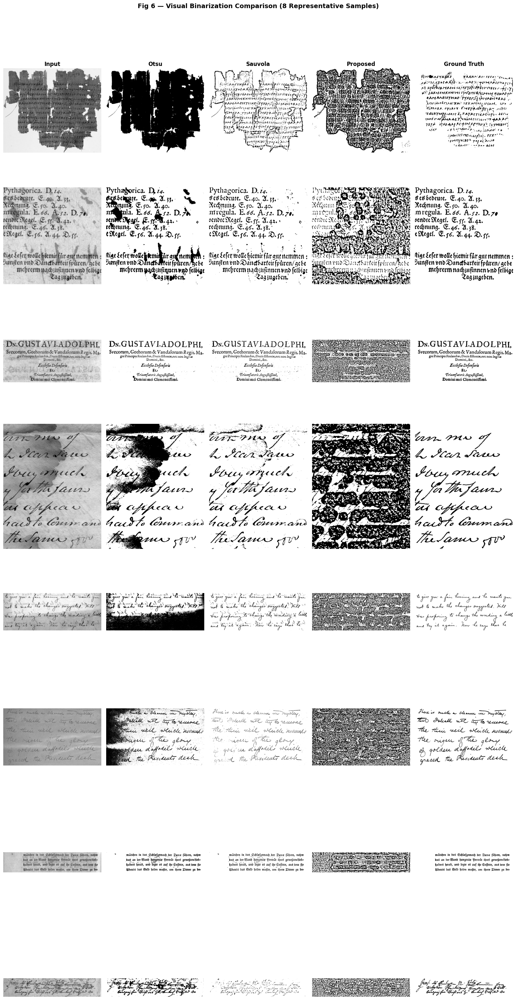

✅ fig6_visual_comparison.png saved


In [35]:
# SECTION 6F: Visual Binarization Comparison (Fig 6)
if all_results:

    import math
    step = max(1, len(PAIRS) // 8)
    show_pairs = PAIRS[::step][:8]

    fig, axes  = plt.subplots(len(show_pairs), 5,
                               figsize=(16, 4*len(show_pairs)))
    if len(show_pairs) == 1:
        axes = axes[np.newaxis, :]

    col_titles = ['Input', 'Otsu', 'Sauvola', 'Proposed', 'Ground Truth']

    for row, p in enumerate(show_pairs):
        gray = cv2.imread(p['img'], cv2.IMREAD_GRAYSCALE)
        gt   = cv2.imread(p['gt'],  cv2.IMREAD_GRAYSCALE)

        if gt is not None and gray.shape != gt.shape:
            gt = cv2.resize(gt, (gray.shape[1], gray.shape[0]),
                            interpolation=cv2.INTER_NEAREST)

        preds = [otsu_binarize(gray), sauvola_binarize(gray), proposed_binarize(gray)]
        imgs  = [gray] + preds + [gt]

        for col, (ax, img) in enumerate(zip(axes[row], imgs)):
            if img is not None:
                ax.imshow(img, cmap='gray')
            ax.axis('off')
            if row == 0:
                ax.set_title(col_titles[col], fontsize=12, fontweight='bold')
            if col == 0:
                ax.set_ylabel(p['name'][:20], fontsize=10, rotation=0,
                               labelpad=65, va='center')

    plt.suptitle(f'Fig 6 — Visual Binarization Comparison ({len(show_pairs)} Representative Samples)',
                 fontsize=14, fontweight='bold', y=1.02)
    plt.tight_layout()
    plt.savefig('fig6_visual_comparison.png', dpi=150, bbox_inches='tight')
    plt.show()
    print('✅ fig6_visual_comparison.png saved')

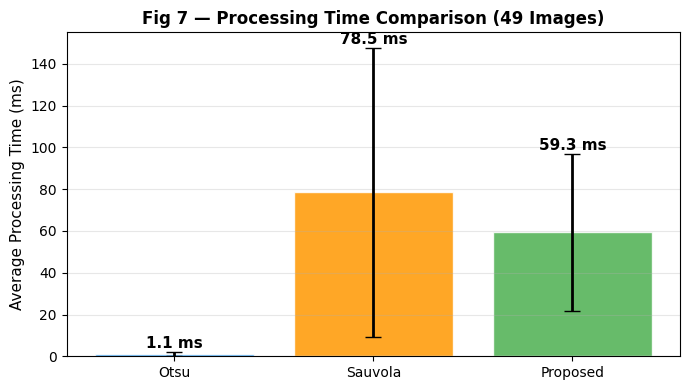

✅ fig7_timing.png saved


In [36]:
# SECTION 6G: Processing Time Chart (Fig 7)
if all_results:
    method_times = {m: [] for m in ['Otsu', 'Sauvola', 'Proposed']}
    for name, res in all_results.items():
        for m in method_times:
            method_times[m].append(res[m]['time_ms'])

    colors_t = {'Otsu': '#2196F3', 'Sauvola': '#FF9800', 'Proposed': '#4CAF50'}
    fig, ax  = plt.subplots(figsize=(7, 4))

    for mname, times in method_times.items():
        ax.bar(mname, np.mean(times), color=colors_t[mname],
               alpha=0.85, edgecolor='white',
               yerr=np.std(times), capsize=6, error_kw={'linewidth':2})
        ax.text(mname, np.mean(times) + np.std(times) + 2,
                f'{np.mean(times):.1f} ms', ha='center', fontsize=11, fontweight='bold')

    ax.set_ylabel('Average Processing Time (ms)', fontsize=11)


    ax.set_title(f'Fig 7 — Processing Time Comparison ({len(all_results)} Images)', fontsize=12, fontweight='bold')
    ax.grid(axis='y', alpha=0.3)

    plt.tight_layout()
    plt.savefig('fig7_timing.png', dpi=150, bbox_inches='tight')
    plt.show()
    print('✅ fig7_timing.png saved')

⏳ Running 9-config ablation on 49 images. Please wait...
  ✓ morph=15 | clip=1.5 | F=27.68% | time=31.5ms
  ✓ morph=15 | clip=2.0 | F=26.05% | time=40.5ms
  ✓ morph=15 | clip=3.0 | F=23.43% | time=31.5ms
  ✓ morph=25 | clip=1.5 | F=25.43% | time=40.8ms
  ✓ morph=25 | clip=2.0 | F=23.87% | time=45.1ms
  ✓ morph=25 | clip=3.0 | F=21.80% | time=47.5ms
  ✓ morph=35 | clip=1.5 | F=24.98% | time=55.7ms
  ✓ morph=35 | clip=2.0 | F=23.61% | time=62.9ms
  ✓ morph=35 | clip=3.0 | F=21.74% | time=59.9ms


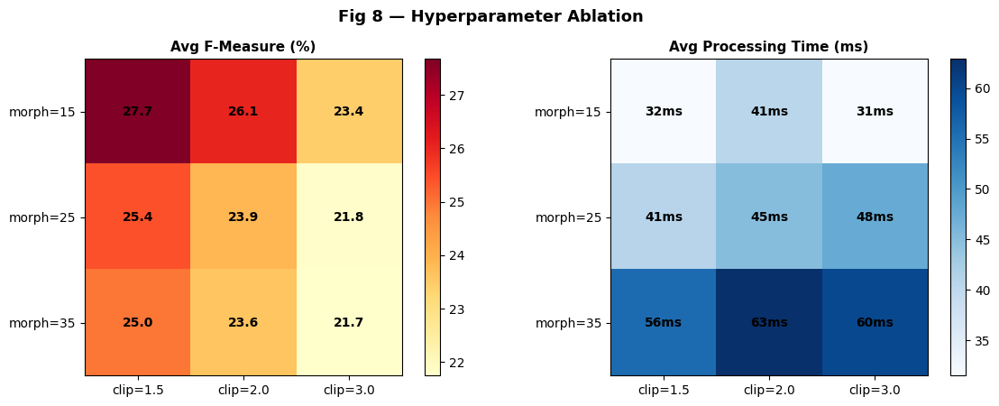

In [37]:
# SECTION 7: Hyperparameter Ablation Study
import time
print(f'⏳ Running 9-config ablation on {len(PAIRS)} images. Please wait...')

morph_sizes = [15, 25, 35]
clahe_clips = [1.5, 2.0, 3.0]

fmat = np.zeros((len(morph_sizes), len(clahe_clips)))
tmat = np.zeros_like(fmat)
hyper_rows = []

for i, msize in enumerate(morph_sizes):
    for j, clip in enumerate(clahe_clips):
        f_scores, times = [], []
        for p in PAIRS:
            gray = cv2.imread(p['img'], cv2.IMREAD_GRAYSCALE)
            gt   = cv2.imread(p['gt'],  cv2.IMREAD_GRAYSCALE)
            if gray is None: continue
            if gray.shape != gt.shape:
                gt = cv2.resize(gt, (gray.shape[1], gray.shape[0]), interpolation=cv2.INTER_NEAREST)

            t0 = time.time()
            pred = proposed_binarize(gray, morph_size=msize, clahe_clip=clip)
            times.append((time.time()-t0)*1000)
            f_scores.append(compute_metrics(pred, gt)['f_measure'])

        avg_f = np.mean(f_scores); avg_t = np.mean(times)
        fmat[i, j] = avg_f; tmat[i, j] = avg_t
        hyper_rows.append({'morph': msize, 'clip': clip, 'f': avg_f, 't': avg_t})
        print(f'  ✓ morph={msize:>2} | clip={clip} | F={avg_f:.2f}% | time={avg_t:.1f}ms')

fig, axes = plt.subplots(1, 2, figsize=(12, 4.5))
im1 = axes[0].imshow(fmat, cmap='YlOrRd')
axes[0].set_xticks(range(len(clahe_clips))); axes[0].set_xticklabels([f'clip={c}' for c in clahe_clips])
axes[0].set_yticks(range(len(morph_sizes))); axes[0].set_yticklabels([f'morph={m}' for m in morph_sizes])
axes[0].set_title('Avg F-Measure (%)', fontsize=11, fontweight='bold')
for ii in range(len(morph_sizes)):
    for jj in range(len(clahe_clips)):
        axes[0].text(jj, ii, f'{fmat[ii,jj]:.1f}', ha='center', va='center', fontweight='bold')
plt.colorbar(im1, ax=axes[0])

im2 = axes[1].imshow(tmat, cmap='Blues')
axes[1].set_xticks(range(len(clahe_clips))); axes[1].set_xticklabels([f'clip={c}' for c in clahe_clips])
axes[1].set_yticks(range(len(morph_sizes))); axes[1].set_yticklabels([f'morph={m}' for m in morph_sizes])
axes[1].set_title('Avg Processing Time (ms)', fontsize=11, fontweight='bold')
for ii in range(len(morph_sizes)):
    for jj in range(len(clahe_clips)):
        axes[1].text(jj, ii, f'{tmat[ii,jj]:.0f}ms', ha='center', va='center', fontweight='bold')
plt.colorbar(im2, ax=axes[1])

plt.suptitle('Fig 8 — Hyperparameter Ablation', fontsize=13, fontweight='bold')
plt.tight_layout()
plt.savefig('fig8_hyperparameter.png', dpi=150, bbox_inches='tight')
plt.show()

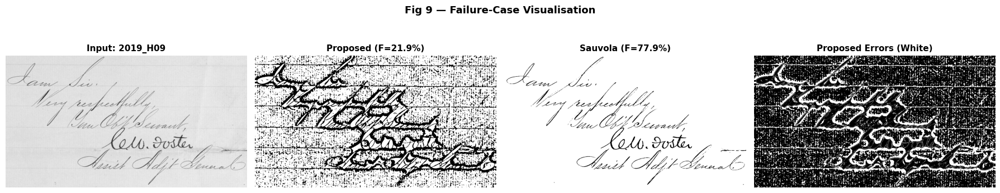

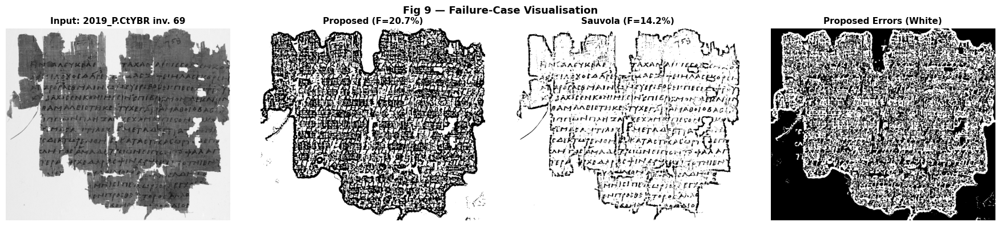

In [38]:
# SECTION 8A: Failure-Case Analysis
printed_pair = next((p for p in PAIRS if 'PR' in p['name'].upper() or 'H09' in p['name'].upper()), PAIRS[0])
hw_pair = next((p for p in PAIRS if 'PSI' in p['name'].upper() or 'P.C' in p['name'].upper()), PAIRS[-1])

showcase_pairs = [printed_pair, hw_pair]

for p in showcase_pairs:
    gray = cv2.imread(p['img'], cv2.IMREAD_GRAYSCALE)
    gt   = cv2.imread(p['gt'],  cv2.IMREAD_GRAYSCALE)
    if gray.shape != gt.shape:
        gt = cv2.resize(gt, (gray.shape[1], gray.shape[0]), interpolation=cv2.INTER_NEAREST)

    final = proposed_binarize(gray)
    sauv = sauvola_binarize(gray)

    metrics_prop = compute_metrics(final, gt)
    metrics_sauv = compute_metrics(sauv, gt)

    fig, axes = plt.subplots(1, 4, figsize=(18, 4))
    imgs = [gray, final, sauv, np.abs(final.astype(int)-gt.astype(int)).clip(0,255).astype(np.uint8)]
    titles = [
        f'Input: {p["name"]}',
        f'Proposed (F={metrics_prop["f_measure"]:.1f}%)',
        f'Sauvola (F={metrics_sauv["f_measure"]:.1f}%)',
        'Proposed Errors (White)'
    ]

    for ax, img, t in zip(axes, imgs, titles):
        ax.imshow(img, cmap='gray')
        ax.set_title(t, fontsize=11, fontweight='bold')
        ax.axis('off')

    plt.suptitle(f'Fig 9 — Failure-Case Visualisation', fontsize=13, fontweight='bold')
    plt.tight_layout()
    plt.savefig(f'fig9_failure_{p["name"]}.png', dpi=150, bbox_inches='tight')
    plt.show()

In [39]:
# SECTION 8B: Failure-Case Summary Table
if all_results:
    print('\n── Failure-Case Summary: Printed Documents vs Papyrus/HW ──')
    print(f'{"Image":<28} {"Proposed F%":>12} {"Sauvola F%":>12} {"Gap":>8} {"Doc Type":>12}')
    print('─' * 76)


    printed_keywords  = ['PR', 'H09', 'H06', 'printed', 'machine']
    papyrus_keywords  = ['PSI', 'P.C', 'P.M', 'P.O', 'handwritten']

    for name, res in all_results.items():
        p_f = res['Proposed']['f_measure']
        s_f = res['Sauvola']['f_measure']
        gap = s_f - p_f

        doc_type = ('Printed'    if any(k in name.upper() for k in [kw.upper() for kw in printed_keywords]) else
                    'Papyrus/HW' if any(k in name.upper() for k in [kw.upper() for kw in papyrus_keywords]) else
                    'Standard')


        flag = ' ← LARGE GAP' if gap > 40 else ''
        print(f'{name[:26]:<28} {p_f:>12.2f} {s_f:>12.2f} {gap:>8.2f} {doc_type:>12}{flag}')

    print('─' * 76)
    print('\n📌 Key finding: The performance gap is consistently largest on clean, machine-printed documents.')
    print('📌 Root causes: (A) Halo artefacts on uniform BG due to CLAHE,')
    print('                (B) Oversized 41px window washing out thin strokes,')
    print('                (C) Aggressive morphological opening (35px) removing text components.')
    print('📌 Proposed fixes: Implement doc-type gating | Use stroke-width-adaptive window | Reduce clip limit to 1.5 for print.')


── Failure-Case Summary: Printed Documents vs Papyrus/HW ──
Image                         Proposed F%   Sauvola F%      Gap     Doc Type
────────────────────────────────────────────────────────────────────────────
2019_P.CtYBR inv. 69                20.69        14.15    -6.54   Papyrus/HW
2019_P.Mich.inv.2755                21.58        37.09    15.51   Papyrus/HW
2019_PSI XIV 1376 r                 28.39        65.94    37.55   Papyrus/HW
2019_P.Oxy.XXII 2309                15.61        55.47    39.87   Papyrus/HW
2019_H06                            12.37        80.55    68.18      Printed ← LARGE GAP
2019_H09                            21.88        77.95    56.07      Printed ← LARGE GAP
2019_PR5                            29.45        88.61    59.16      Printed ← LARGE GAP
2019_PR1                            34.86        88.91    54.05      Printed ← LARGE GAP
2011_PR3                            48.61        90.46    41.85      Printed ← LARGE GAP
2011_PR7                        

In [40]:
# SECTION 9: Export Results
from google.colab import files
import json

with open('results/metrics.json', 'w') as f:
    json.dump(all_results, f, indent=2)

zip_name = 'binarization_final_results.zip'
with zipfile.ZipFile(zip_name, 'w') as zf:
    for fn in sorted(os.listdir('.')):
        if fn.startswith('fig') and fn.endswith('.png'):
            zf.write(fn)
            print(f'  + {fn}')
    zf.write('results/metrics.json', 'metrics.json')

print(f'\n📦 {zip_name} is ready! Downloading...')
files.download(zip_name)

  + fig1_batch_01.png
  + fig1_batch_02.png
  + fig1_batch_03.png
  + fig1_batch_04.png
  + fig1_batch_05.png
  + fig1_batch_06.png
  + fig1_batch_07.png
  + fig1_batch_08.png
  + fig1_batch_09.png
  + fig1_batch_10.png
  + fig1_dataset_samples.png
  + fig2_pipeline_steps.png
  + fig3_fmeasure_comparison.png
  + fig3b_per_year_fmeasure.png
  + fig4_avg_metrics.png
  + fig5_psnr_comparison.png
  + fig6_visual_comparison.png
  + fig7_timing.png
  + fig8_hyperparameter.png
  + fig9_failure_2019_H09.png
  + fig9_failure_2019_P.CtYBR inv. 69.png

📦 binarization_final_results.zip is ready! Downloading...


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>